# Your Uni : ql2510. (Also change Uni in the title of your notebook)
# Your AI Model Share Username: liqiankun
# Your Full name : Qiankun Li
# Link to your Public Github repository with Final report  : https://github.com/artemlevinh/Predicting-Happiness-Based-on-Economical-Educational-and-Geographical-Data


# World Happiness Classification Competition
Goals :
- Understand how the models function
- Understand what the parameters control
- Share your models to a centralized leaderboard
- Learn from the model experimentation process
- Make a good looking notebook report
- Upload as a personal project on Github

**Overall Steps:**
1.   Get data in and set up X_train / X_test / y_train
2.   Preprocess data using Sklearn Column Transformer/ Write and Save Preprocessor function
3. Fit model on preprocessed data and save preprocessor function and model
4. Generate predictions from X_test data and submit model to competition
5. Repeat submission process to improve place on leaderboard



In [4]:
#install aimodelshare library
! pip install aimodelshare --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 975.8/975.8 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.3/96.3 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.5/298.5 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 72.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 329.0/329.0 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.4/178.4 kB 20.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.0/147.0 kB 

## 0. Get data in and set up X_train, X_test, y_train objects

**Instructions:**
Upload the world_happiness_competition_data.zip and newcountryvars.csv files on Colab by pressing the Folder icon on left tab (Shows "Files" on hovering), and then clicking the left-most file upload button (Shows "Upload to Session Storage" Alt text on hovering)

In [7]:
# Get competition data from course folder and unzip
# importing the zipfile module
from zipfile import ZipFile

# loading the temp.zip and creating a zip object
with ZipFile("/world_happiness_competition_data.zip", 'r') as zObject:

    # Extracting all the members of the zip
    # into a specific location.
    zObject.extractall()

In [8]:
# Load data
import pandas as pd
X_train = pd.read_csv('world_happiness_competition_data/X_train.csv')
X_test = pd.read_csv('world_happiness_competition_data/X_test.csv')
#y_test = pd.read_csv('world_happiness_competition_data/y_test.csv')
y_train = pd.read_csv('world_happiness_competition_data/y_train.csv')
y_train_labels = y_train.idxmax(axis=1) ## Examine what this does and write in next cell

X_train.head()

,Country or region,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,name,region,sub-region,Terrorist_attacks
0,Peru,0.960,1.274,0.854,0.455,0.083,0.027,Peru,Americas,Latin America and the Caribbean,18.000000
1,Nicaragua,0.694,1.325,0.835,0.435,0.200,0.127,Nicaragua,Americas,Latin America and the Caribbean,125.611111
2,Greece,1.181,1.156,0.999,0.067,0.000,0.034,Greece,Europe,Southern Europe,112.000000
3,Qatar,1.684,1.313,0.871,0.555,0.220,0.167,Qatar,Asia,Western Asia,57.333333
4,Uzbekistan,0.745,1.529,0.756,0.631,0.322,0.240,Uzbekistan,Asia,Central Asia,125.611111


In [9]:
print(y_train)

    Average  High  Low  Very High  Very Low
0         1     0    0          0         0
1         0     1    0          0         0
2         1     0    0          0         0
3         0     0    0          1         0
4         0     1    0          0         0
..      ...   ...  ...        ...       ...
83        1     0    0          0         0
84        0     0    1          0         0
85        0     0    0          1         0
86        1     0    0          0         0
87        0     0    1          0         0

[88 rows x 5 columns]


*Write* in the next cell what the y_train_labels = y_train.idxmax(axis=1) line does. What is the difference between y_train_labels and y_train?

In [10]:
# Your answer: According to Pandas documentation, idxmas returns the row label of the maximum value. The result is the happiness values (label) of each country. Since only the assigned happiness value has 1 and 0 is elsewhere. Only the assigned happiness value is placed as the labels.

According to Pandas documentation, idxmas returns the row label of the maximum value. The result is the happiness values (label) of each country. Since only the assigned happiness value has 1 and 0 is elsewhere. Only the assigned happiness value is placed as the labels.

##  Add new data

In [12]:
# Truncated and cleaned up region data to merge (Week 4 folder)
countrydata=pd.read_csv("/newcountryvars.csv")

countrydata.head()

,country_name,population,population_below_poverty_line,hdi,life_expectancy,expected_years_of_schooling,mean_years_of_schooling,gni
0,India,1339180127,21.9,0.623559,68.322,11.696590,6.298834,5663.474799
1,Nigeria,190886311,70.0,0.527105,53.057,9.970482,6.000000,5442.901264
2,Mexico,129163276,46.2,0.761683,76.972,13.299090,8.554985,16383.106680
3,Pakistan,197015955,29.5,0.550354,66.365,8.106910,5.089460,5031.173074
4,Bangladesh,164669751,31.5,0.578824,71.985,10.178706,5.241577,3341.490722


In [13]:
# Merge in new data to X_train and X_test by taking "Country or region" from first table and "country_name" from 2nd table.

X_train = X_train.merge(countrydata, how='left', left_on='Country or region', right_on='country_name')
X_test = X_test.merge(countrydata, how='left', left_on='Country or region', right_on='country_name')

# Drop the redundant columns after merging
X_train.drop(columns=['Country or region', 'country_name'], inplace=True)
X_test.drop(columns=['Country or region', 'country_name'], inplace=True)


In [ ]:
X_train.head(1)

# EDA

In [16]:
print(X_train.dtypes)

GDP per capita                   float64
Social support                   float64
Healthy life expectancy          float64
Freedom to make life choices     float64
Generosity                       float64
Perceptions of corruption        float64
name                              object
region                            object
sub-region                        object
Terrorist_attacks                float64
population                       float64
population_below_poverty_line    float64
hdi                              float64
life_expectancy                  float64
expected_years_of_schooling      float64
mean_years_of_schooling          float64
gni                              float64
dtype: object


Describe what you see above?

In [17]:
## Your answer: we see the data type for each label (column). Most are float64 numbers, some are strings (names).

Find out the number and percentage of missing values in the table per column




In [18]:
missing_values_count = X_train.isnull().sum()

# Percentage of missing values per column
missing_values_percentage = (missing_values_count / len(X_train)) * 100

# Combine into a DataFrame
missing_data = pd.DataFrame({'Missing Values': missing_values_count, 'Percentage': missing_values_percentage})
missing_data.sort_values(by='Missing Values', ascending=False, inplace=True)

print(missing_data)

                               Missing Values  Percentage
population_below_poverty_line              15   17.045455
gni                                         6    6.818182
mean_years_of_schooling                     6    6.818182
expected_years_of_schooling                 6    6.818182
life_expectancy                             6    6.818182
hdi                                         6    6.818182
population                                  6    6.818182
Terrorist_attacks                           0    0.000000
GDP per capita                              0    0.000000
Social support                              0    0.000000
region                                      0    0.000000
name                                        0    0.000000
Perceptions of corruption                   0    0.000000
Generosity                                  0    0.000000
Freedom to make life choices                0    0.000000
Healthy life expectancy                     0    0.000000
sub-region    

Plot the frequency distribution / histogram of some of the numerical features that you think are important

In [19]:
#print(X_train)

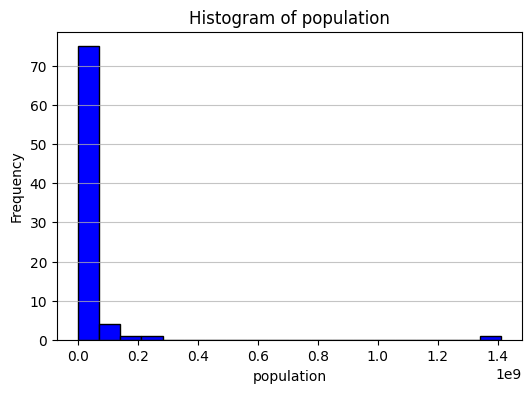

In [20]:
# Your plotting code here:
import matplotlib.pyplot as plt
feature = 'population'

# Plot histogram
plt.figure(figsize=(6, 4))
plt.hist(X_train[feature].dropna(), bins=20, color='blue', edgecolor='black')
plt.xlabel(feature)
plt.ylabel('Frequency')
plt.title('Histogram of ' + feature)
plt.grid(axis='y', alpha=0.75)
plt.show()

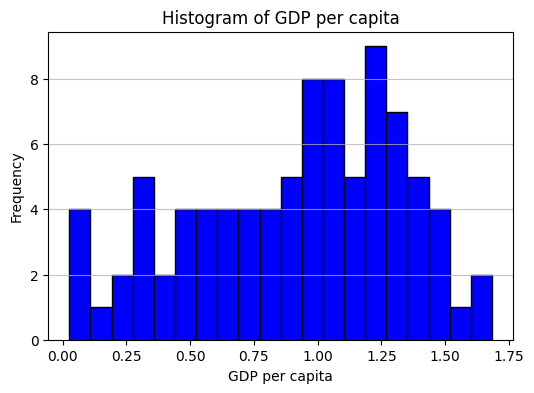

In [21]:
feature = 'GDP per capita'

# Plot histogram
plt.figure(figsize=(6, 4))
plt.hist(X_train[feature].dropna(), bins=20, color='blue', edgecolor='black')
plt.xlabel(feature)
plt.ylabel('Frequency')
plt.title('Histogram of ' + feature)
plt.grid(axis='y', alpha=0.75)
plt.show()

Plot the categorical variables and their distribution

*斜体文本*

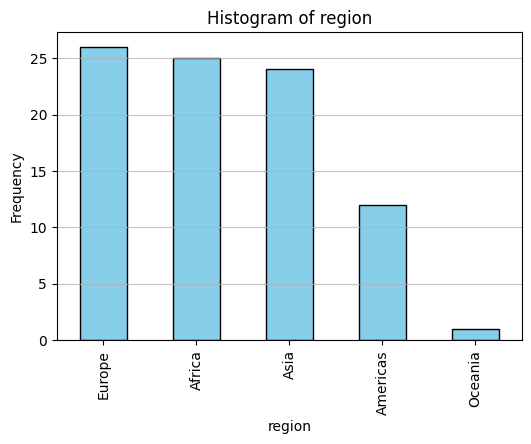

In [22]:
##Your Plotting Code Here
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
X_train['region'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('region')
plt.ylabel('Frequency')
plt.title('Histogram of ' + 'region')
plt.grid(axis='y', alpha=0.75)
plt.show()

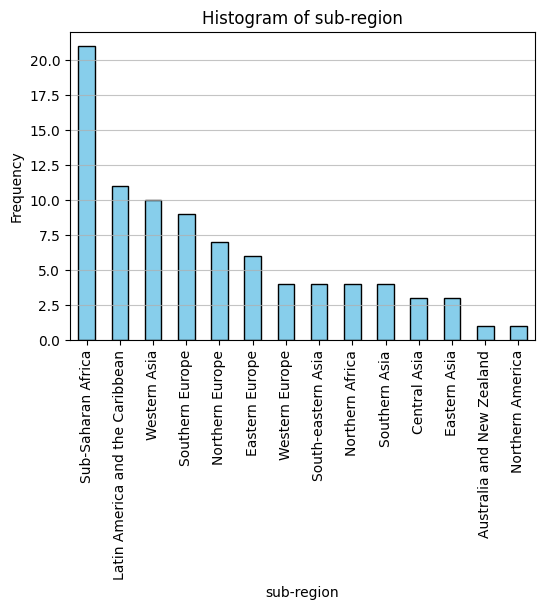

In [23]:
plt.figure(figsize=(6, 4))
X_train['sub-region'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('sub-region')
plt.ylabel('Frequency')
plt.title('Histogram of ' + 'sub-region')
plt.grid(axis='y', alpha=0.75)
plt.show()

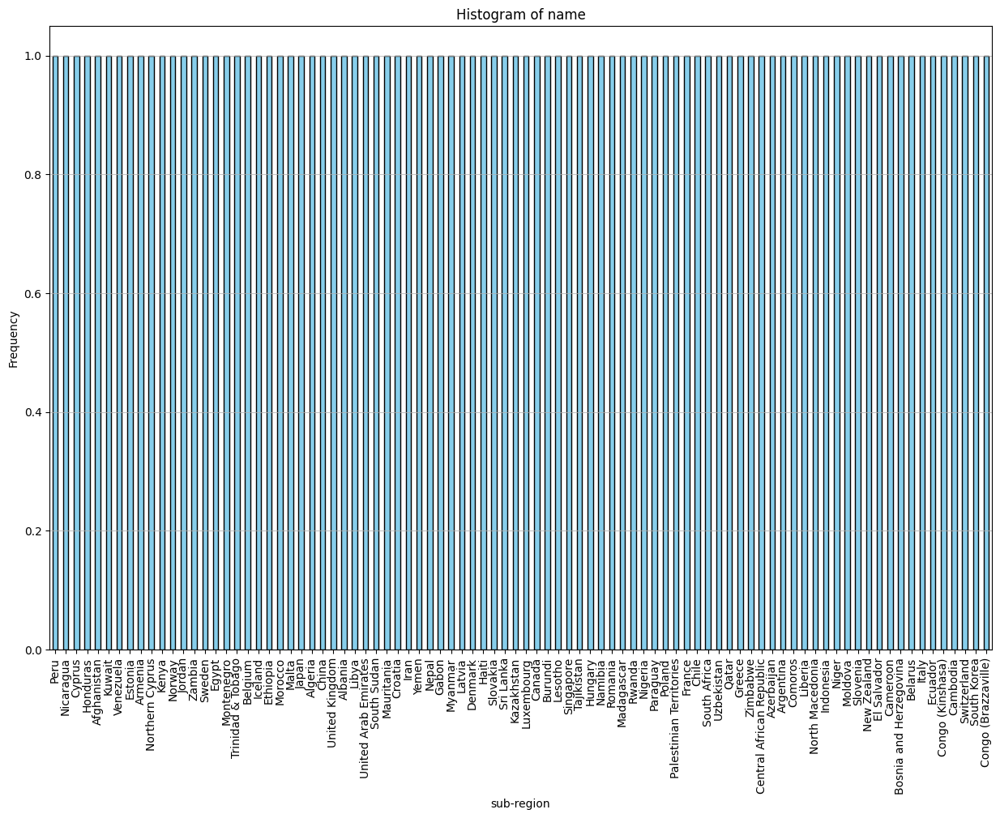

In [24]:
plt.figure(figsize=(15, 10))
X_train['name'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('sub-region')
plt.ylabel('Frequency')
plt.title('Histogram of ' + 'name')
plt.grid(axis='y', alpha=0.75)
plt.show()

Explore relationships between variables (bivariate, etc), correlation tables, and how they associate with the target variable.

<ipython-input-25-cb26e25a1fe7>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = X_train.corr()


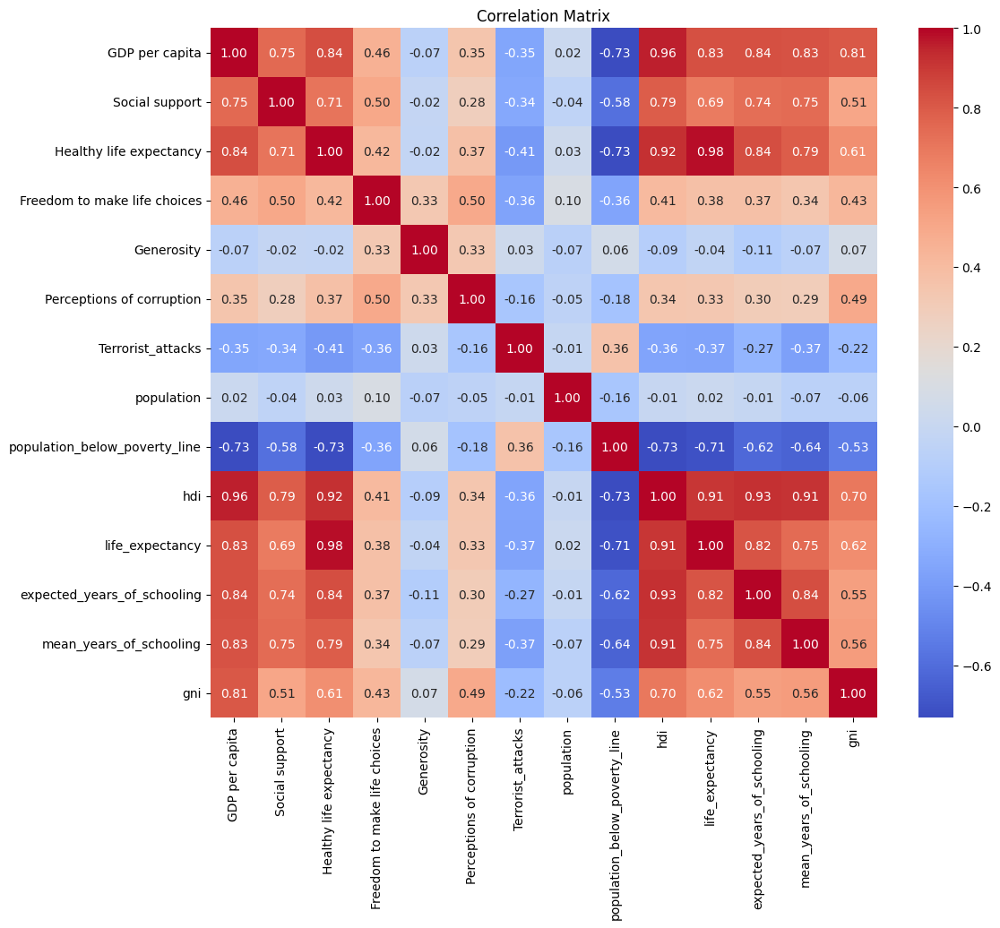

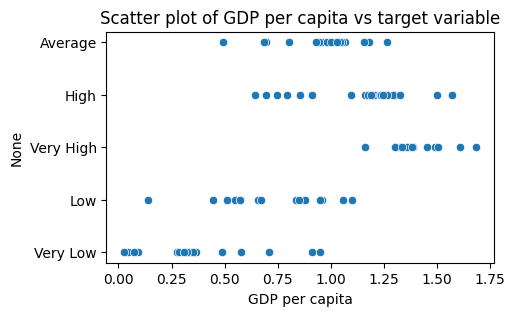

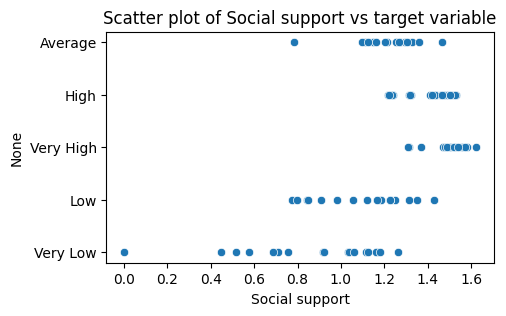

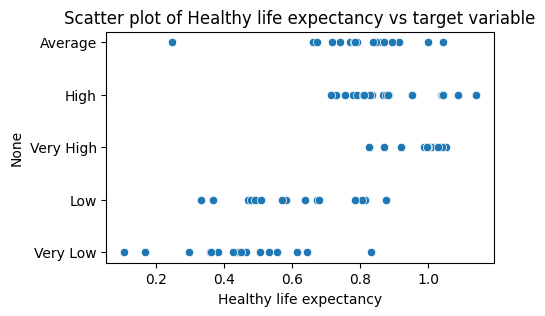

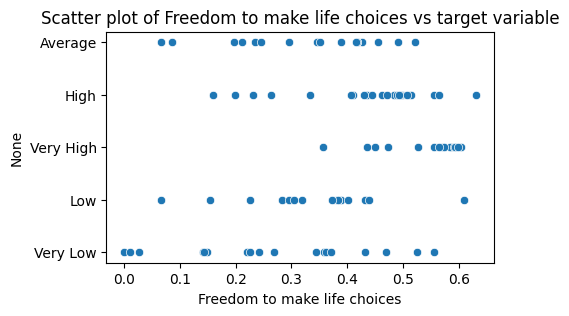

...

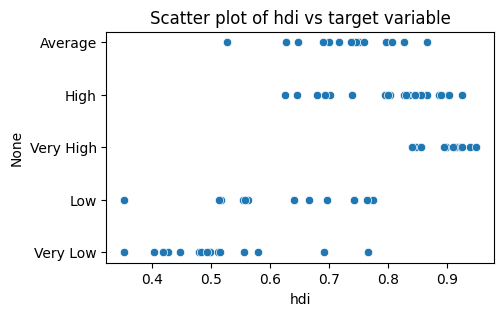

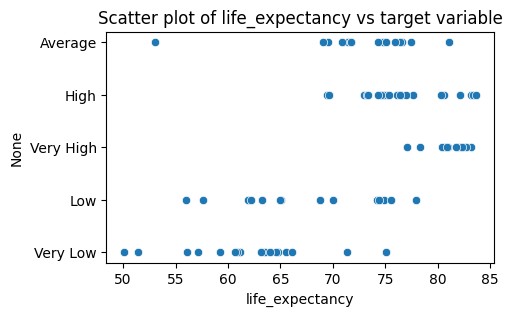

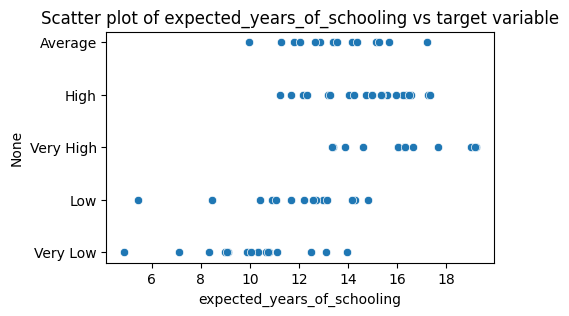

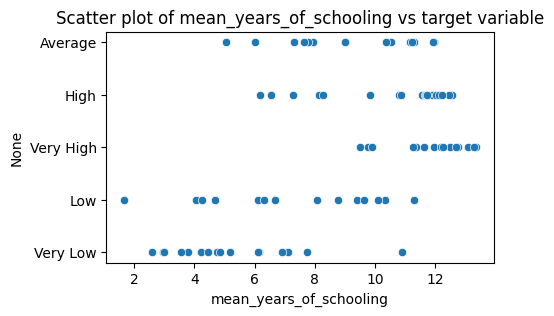

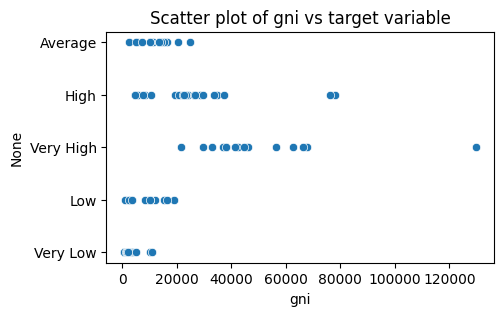

In [25]:
# Your plotting code(s) here:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = X_train.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

# Explore bivariate relationships of each value with the target variable
for column in X_train.columns:
    if X_train[column].dtype != 'object':
        plt.figure(figsize=(5, 3))
        sns.scatterplot(data=X_train, x=column, y=y_train_labels)
        plt.title('Scatter plot of ' + column + ' vs target variable')
        plt.show()

Write what you observed and your General comments on what should be done:

In [26]:
# Your comments here: The bivariate relation between each variable and the target vaiable is too obscure; there is no linear or other relation between them. This is probably because there are many other variables that also influence the target variable.Also we may observe that the covariance of variables in the same aspect (for example health life and life expectancy) are highly related, wherea data of irrelevant fields such as terrorist attach and population, have low covariance.

The bivariate relation between each variable and the target vaiable is too obscure; there is no linear or other obvious relation between them. This is probably because there are many other variables that also influence the target variable. Also we may observe that the covariance of variables in the same aspect (for example health life and life expectancy) are highly related, wherea data of irrelevant fields such as terrorist attach and population, have low covariance.

##2.   Preprocess data using Sklearn Column Transformer/ Write and Save Preprocessor function


In [27]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Create the preprocessing pipelines for both numeric and categorical data.

numeric_features = X_train.select_dtypes(include=['float64', 'int64'])## Drop all the non-numerical features from X_train
numeric_features=numeric_features.columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)), ## Is this good enough?
    ('scaler', StandardScaler())]) # You will need to describe why this is being done in the next cell

categorical_features = ['region', 'sub-region']

#Replacing missing values with Modal value and then one hot encoding.
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Replace missing values with the most frequent value
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])  # One-hot encode the categorical features, ignore unknown categories

# final preprocessor object set up with ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

#Fit your preprocessor object
preprocess=preprocessor.fit(X_train)

Describe step-by-step what we are doing above, and why? You are free to change how values are imputed. What change did you make if any, and why?

In [28]:
## Your answer: this part transform our data into a np.array that we can "feed" into our machine. For numerical values, we scale them such that the absolute value of each scaled entry is roughly 1. There are two major concerns for scaling: Faster Convergence: Scaling input features helps gradient descent algorithms converge faster. When features are on different scales, the optimization process may take longer to find the optimal weights. Numerical Stability: Large differences in the scales of input features can lead to numerical stability issues in the model. Scaling helps to avoid these issues and ensures that the optimization algorithm behaves predictably. For cetegorical features (strings), we convert them into onehot vectors. Note that for missing values, I replace the N/A with the most frequent one.


This part transform our data into a np.array that we can "feed" into our machine. For numerical values, we scale them such that the absolute value of each scaled entry is roughly 1. There are two major concerns for scaling: Faster Convergence: Scaling input features helps gradient descent algorithms converge faster. When features are on different scales, the optimization process may take longer to find the optimal weights. Numerical Stability: Large differences in the scales of input features can lead to numerical stability issues in the model. Scaling helps to avoid these issues and ensures that the optimization algorithm behaves predictably. For cetegorical features (strings), we convert them into onehot vectors. Note that for missing values, I replace the N/A with the most frequent one.


In [29]:
print(X_train.head(1))

   GDP per capita  Social support  Healthy life expectancy  \
0            0.96           1.274                    0.854   

   Freedom to make life choices  Generosity  Perceptions of corruption  name  \
0                         0.455       0.083                      0.027  Peru   

     region                       sub-region  Terrorist_attacks  population  \
0  Americas  Latin America and the Caribbean               18.0  32165485.0   

   population_below_poverty_line       hdi  life_expectancy  \
0                           22.7  0.739749           74.814   

   expected_years_of_schooling  mean_years_of_schooling          gni  
0                     13.38634                  9.01347  11294.84033  


In [30]:
# Write function to transform data with preprocessor

def preprocessor(data):
    data.drop(['region', 'name'], axis=1)
    preprocessed_data=preprocess.transform(data)
    return preprocessed_data

What are the differences between the "preprocessor" object, the "preprocess" object, the "preprocessor" function,  and the "preprocessed_data" that is returned finally?

In [31]:
## Your Answer: preprocessor defines the properties (attributes), and specifying the behaviors (methods) of data. Preprocess is a flow (work structure) that we process data. The preprocessor function is the function we call when we need to transform data. The proprocessed data is the numeric value that the preprocess function returns. The data is scaled and converted.

In [32]:
# check shape of X data after preprocessing it using our new function
preprocessor(X_train).shape

(88, 33)

In [33]:
preprocessor(X_train)

array([[ 0.10444464,  0.20603101,  0.45831144, ...,  0.        ,
         0.        ,  0.        ],
       [-0.54388211,  0.38059533,  0.37791099, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.64309205, -0.19786289,  1.07189386, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 1.01356448,  1.10965806,  1.05919905, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.27261963, -0.30397062,  0.62334396, ...,  0.        ,
         0.        ,  0.        ],
       [-0.5950658 , -1.4198131 , -1.00582315, ...,  1.        ,
         0.        ,  0.        ]])

##3. Fit model on preprocessed data and save preprocessor function and model


In [34]:
print(preprocessor(X_train))

[[ 0.10444464  0.20603101  0.45831144 ...  0.          0.
   0.        ]
 [-0.54388211  0.38059533  0.37791099 ...  0.          0.
   0.        ]
 [ 0.64309205 -0.19786289  1.07189386 ...  0.          0.
   0.        ]
 ...
 [ 1.01356448  1.10965806  1.05919905 ...  0.          0.
   0.        ]
 [ 0.27261963 -0.30397062  0.62334396 ...  0.          0.
   0.        ]
 [-0.5950658  -1.4198131  -1.00582315 ...  1.          0.
   0.        ]]


In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train_processed = preprocessor(X_train)
# Define the Random Forest model
model_1 = RandomForestClassifier(n_estimators=100)

# Fit the model to the training data
model_1.fit(X_train_processed, y_train_labels)
y_predict = model_1.predict(preprocessor(X_test))


## Define a Random Forest Model here, fit it, and score it


# Your cell should have a score between 0-1 as output

In [36]:
#Example of self scoring by splitting training data
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


X_train_split3, X_val3, y_train_split3, y_val3 = train_test_split(X_train, y_train_labels, test_size=0.2, random_state=42)
model_3 = RandomForestClassifier(n_estimators=200, max_depth=5, max_features='auto')
# Fit the model to the training data
X_train_processed3 = preprocessor(X_train_split3)
model_3.fit(X_train_processed3, y_train_split3)
y_predict3 = model_3.predict(preprocessor(X_val3))

score3 = accuracy_score(y_val3, y_predict3)
print("Model 3 score:", score3)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Model 3 score: 0.3888888888888889


#### Save preprocessor function to local "preprocessor.zip" file

In [37]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor,"")

Your preprocessor is now saved to 'preprocessor.zip'


#### Save model to local ".onnx" file

In [38]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model_1, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

## 4. Generate predictions from X_test data and submit model to competition


In [39]:
#Set credentials using modelshare.org username/password

from aimodelshare.aws import set_credentials

#This is the unique rest api that powers this World Happiness Classification Playground
## Do not change this
apiurl="https://e2w6gh3id1.execute-api.us-east-2.amazonaws.com/prod/m"

set_credentials(apiurl=apiurl)

Modelshare.ai Username:··········
Modelshare.ai Password:··········
Modelshare.ai login credentials set successfully.


In [40]:
#Instantiate Competition
import aimodelshare as ai
mycompetition= ai.Competition(apiurl)

In [41]:
#Submit Model 1:

#-- Generate predicted values (Model 1)
prediction_labels = model_1.predict(preprocessor(X_test))

model_filepath1 = "model.onnx"
preprocessor_filepath="preprocessor.zip"

# Submit Model 1 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath1,
                           preprocessor=preprocessor_filepath,
                                 prediction_submission=prediction_labels)

Insert search tags to help users find your model (optional): QMSS
Provide any useful notes about your model (optional): Qiankun Li

Your model has been submitted as model version 1129

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


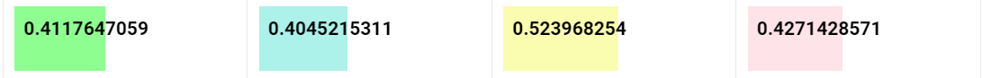

In [42]:
# Get leaderboard to explore current best model architectures

# Get raw data in pandas data frame
data = mycompetition.get_leaderboard()

# Stylize leaderboard data
mycompetition.stylize_leaderboard(data)

## 5. Repeat submission process to improve place on leaderboard


In [43]:
# Train and submit model 2 using same preprocessor (note that you could save a new preprocessor, but we will use the same one for this example).
from sklearn.ensemble import RandomForestClassifier

model_2 = RandomForestClassifier(n_estimators=200, max_depth = 5, max_features='auto')

# Fit the model to the training data
model_2.fit(X_train_processed, y_train_labels)
y_predict = model_2.predict(preprocessor(X_test))


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Illustation of how the grading works
```Python
y_val_real = [
    'Low',
    'Average',
    'Low',
    'Very Low',
    'Very Low',
    'High',
    'Average',
    'High',
    'High',
    'Very Low',
    'Very High',
    'Average',
    'Very Low',
    'Low',
    'Low',
    'High',
    'High',
    'Average'
]


count = 0
for i in range(len(y_predict)):
  if y_predict[i] == y_val_real[i]:
    count += 1

print(count/len(y_val))

```

 What changes did you make, what do the parameters you changed control, and why does it improve performance?

In [44]:
## Your answer: I increase the number of estimators and the max depth. Both parameters increase the complexity of the model, helping intepreting complicated relations. It improves performance because increased number of estimators and depth resolves underfitting.

In [45]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

feature_count= len(X_train.columns)# Get count of preprocessed features
initial_type = [('input', FloatTensorType([1, feature_count]))] # Insert correct number of preprocessed features
onnx_model = model_to_onnx(model_2, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

# Serialize your model to save it as an onnx file


In [46]:
#Submit Model 2:

#-- Generate predicted y values (Model 2)
prediction_labels2 = model_2.predict(preprocessor(X_test))# Predict
model_filepath2 = "model.onnx"# Your serialized model

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath2,
                                 prediction_submission=prediction_labels2,
                                 preprocessor=preprocessor_filepath)

Insert search tags to help users find your model (optional): QMSS
Provide any useful notes about your model (optional): Qiankun Li

Your model has been submitted as model version 1130

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


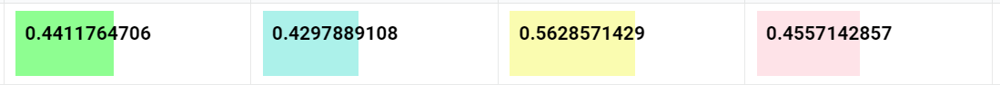

In [47]:
# Compare two or more models
data=mycompetition.compare_models([1105,1108], verbose=1)
mycompetition.stylize_compare(data)

,param_name,default_value,model_version_1105,model_version_1108
0,bootstrap,True,True,True
1,ccp_alpha,0.000000,0.000000,0.000000
2,class_weight,None,None,None
3,criterion,gini,gini,gini
4,max_depth,None,None,None
5,max_features,sqrt,sqrt,sqrt
6,max_leaf_nodes,None,None,None
7,max_samples,None,None,None
8,min_impurity_decrease,0.000000,0.000000,0.000000
9,min_samples_leaf,1,1,1


Do you think it is worth making more changes to the parameters? Should we keep trying random values and see what works better? What is an alternative to doing this manually?

In [48]:
## Your answer:It is no worth it, because adjusting by hand is too much work. We need a systematic way (hyperparameter tunning) to computed the optimal parameters. We should apply the grid hyperparameter search method to compare different parameters. We try all possible combinations of paramters in discrete space and use the parameters doing the best job.

In [49]:
# Submit a third model using GridSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import numpy as np

param_grid = {
    'n_estimators': np.arange(100, 300, 100),  # Number of trees in the forest
    'max_depth': np.arange(5, 35, 10),  # Maximum depth of the tree
    'min_samples_split': np.arange(2, 10, 2),  # Minimum number of samples required to split an internal node
    'min_samples_leaf': np.arange(1, 3),  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider at every split
}# Use np.arange to create a sequence of numbers for each parameter's space you think should be searched
rf = RandomForestClassifier()

gridmodel = GridSearchCV(rf, param_grid, cv=5, n_jobs=-1) # Read GridSearchCV docs and create an object with RandomForestClassifier as the model

#use model methods to fit score and predict model:

# Fit the model to the training data
gridmodel.fit(X_train_processed, y_train_labels)


#extract best score and parameter by calling objects "best_score_" and "best_params_"
print("best mean cross-validation score: {:.3f}".format(gridmodel.best_score_))
print("best parameters: {}".format(gridmodel.best_params_))


best mean cross-validation score: 0.672
best parameters: {'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


output of this cell is: best mean cross-validation score: 0.660
best parameters: {'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(

In [50]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  # Insert correct number of preprocessed features

onnx_model = model_to_onnx(gridmodel, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("gridmodel.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [51]:
#Submit Model 3:

#-- Generate predicted values
model_best = RandomForestClassifier(n_estimators=100, max_depth = 5, min_samples_leaf = 1, min_samples_split = 4, max_features='log2')

# Fit the model to the training data
model_best.fit(X_train_processed, y_train_labels)

# Submit to Competition Leaderboard
prediction_labels_best = model_best.predict(preprocessor(X_test))# Predict
model_filepath4 = "model.onnx"# Your serialized model

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath4,
                                 prediction_submission=prediction_labels_best,
                                 preprocessor=preprocessor_filepath)

Insert search tags to help users find your model (optional): QMSS
Provide any useful notes about your model (optional): Qiankun Li

Your model has been submitted as model version 1131

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [52]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

In [53]:
# Compare two or more models
data=mycompetition.compare_models([3,4], verbose=1)
mycompetition.stylize_compare(data)

,param_name,default_value,model_version_3,model_version_4
0,bootstrap,True,True,True
1,ccp_alpha,0.000000,0.000000,0.000000
2,class_weight,None,None,None
3,criterion,gini,gini,gini
4,max_depth,None,5,5
5,max_features,auto,auto,auto
6,max_leaf_nodes,None,None,None
7,max_samples,None,None,None
8,min_impurity_decrease,0.000000,0.000000,0.000000
9,min_impurity_split,None,None,None


```Python
# Here are several classic ML architectures you can consider choosing from to experiment with next:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier


model = ## Read documentations of imported models and fit them.

# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  # Insert correct number of preprocessed features

onnx_model = model_to_onnx(model, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

#-- Generate predicted values
prediction_labels = model.predict(preprocessor(X_test))

model_filepath4 = "model.onnx"

# Submit model to Competition Leaderboard
mycompetition.submit_model(model = model_filepath4,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)
```

In [69]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier


model4 = GradientBoostingClassifier(loss='log_loss',
                                    n_estimators=100,
                                    max_depth=5,
                                    learning_rate=0.1)

model4.fit(X_train_processed,y_train_labels)


with open("model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

# -- Generate predicted values
prediction_labels = model4.predict(preprocessor(X_test))

model_filepath4 = "model.onnx"

# Submit model to Competition Leaderboard
mycompetition.submit_model(model = model_filepath4,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)

Insert search tags to help users find your model (optional): QMSS
Provide any useful notes about your model (optional): Qiankun Li 

Your model has been submitted as model version 1133

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


Describe what were the parameters you defined in GradientBoostingClassifier, and/or BaggingClassifier, and/or KNNs, and/or SVC? What worked and why?

In [70]:
## Your answer: I defined the loss function to be log-loss. Also I defined the number of estimators and max_depth, as well as the learning rate(rate of descent when optimizing the loss function).

# 6. Basic Deep Learning

In [71]:
feature_count = len(X_train.columns)
print(feature_count)

17


In [72]:
# Now experiment with deep learning models:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
import numpy as np


feature_count=X_train_processed.shape[1]#count features in input data

keras_model = Sequential()
keras_model.add(Dense(128, input_dim=feature_count, activation='relu'))
keras_model.add(Dense(64, activation='relu'))
keras_model.add(Dense(64, activation='relu'))
keras_model.add(Dense(32, activation='relu'))## Define a Neural Network Model with 5 layers 128->64->64->32->(?)


#Use Softmax activation in last layer. How many neurons should there be in the last layer?
num_classes = 5
keras_model.add(Dense(num_classes, activation='softmax'))


# Compile model
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Fitting the NN to the Training set
keras_model.fit(preprocessor(X_train), y_train, ## Note that keras models require a one-hot-encoded y_train object
               batch_size = 20,
               epochs = 300, validation_split=0.25)

Epoch 1/300
4/4 [==============================] - 1s 131ms/step - loss: 1.6623 - accuracy: 0.1818 - val_loss: 1.6515 - val_accuracy: 0.1818
Epoch 2/300
4/4 [==============================] - 0s 23ms/step - loss: 1.6410 - accuracy: 0.1970 - val_loss: 1.6397 - val_accuracy: 0.1818
Epoch 3/300
4/4 [==============================] - 0s 24ms/step - loss: 1.6225 - accuracy: 0.2424 - val_loss: 1.6277 - val_accuracy: 0.2273
Epoch 4/300
4/4 [==============================] - 0s 25ms/step - loss: 1.6038 - accuracy: 0.2576 - val_loss: 1.6133 - val_accuracy: 0.2727
Epoch 5/300
4/4 [==============================] - 0s 24ms/step - loss: 1.5828 - accuracy: 0.2727 - val_loss: 1.5986 - val_accuracy: 0.2727
Epoch 6/300
4/4 [==============================] - 0s 23ms/step - loss: 1.5640 - accuracy: 0.2879 - val_loss: 1.5848 - val_accuracy: 0.2727
Epoch 7/300
4/4 [==============================] - 0s 21ms/step - loss: 1.5444 - accuracy: 0.3485 - val_loss: 1.5712 - val_accuracy: 0.2273
Epoch 8/300
4/4 [==

Which activations did you use in the middle layers? Why was softmax used in the last layer?

In [73]:
## Your answer: I use the Relu in the middle layer. Softmax activation is used in the last layer to handle multi-class classification, because the function has range over [0,5], unlike sigmoid function only range over +-1.

Was it a good idea to train for 300 epochs? Should you train a bit more? Why or why not?

In [74]:
## Your answer: For our data specially, we can train over 300 epochs because we have a small training set because small batch size usually in better optimization. But for large dataset, we need to have fewer epochs to minimize optimization time.

Why is loss='categorical_crossentropy' and optimizer='sgd'? Would you want to change something? Why / Why not?

In [75]:
## Your answer:It says that we are using crossentropy as our loss function and stochastic gradient descent as our optimizing method. We can change the optimizer to be gradient descent sometimes. But we ought to use cross-entrophy function since the function is always convex (has just 1 extrema). Other loss functions may  not be convex

Can you try getting the model's training history out and plotting the curves?

Epoch 1/300
4/4 [==============================] - 0s 33ms/step - loss: 0.1487 - accuracy: 0.9697 - val_loss: 1.3090 - val_accuracy: 0.5455
Epoch 2/300
4/4 [==============================] - 0s 18ms/step - loss: 0.1497 - accuracy: 0.9848 - val_loss: 1.2858 - val_accuracy: 0.5455
Epoch 3/300
4/4 [==============================] - 0s 22ms/step - loss: 0.1467 - accuracy: 0.9848 - val_loss: 1.2720 - val_accuracy: 0.6364
Epoch 4/300
4/4 [==============================] - 0s 19ms/step - loss: 0.1480 - accuracy: 0.9848 - val_loss: 1.2745 - val_accuracy: 0.6364
Epoch 5/300
4/4 [==============================] - 0s 19ms/step - loss: 0.1431 - accuracy: 0.9848 - val_loss: 1.2847 - val_accuracy: 0.6364
Epoch 6/300
4/4 [==============================] - 0s 15ms/step - loss: 0.1473 - accuracy: 0.9848 - val_loss: 1.2468 - val_accuracy: 0.6364
Epoch 7/300
4/4 [==============================] - 0s 19ms/step - loss: 0.1535 - accuracy: 0.9697 - val_loss: 1.2731 - val_accuracy: 0.6364
Epoch 8/300
4/4 [===

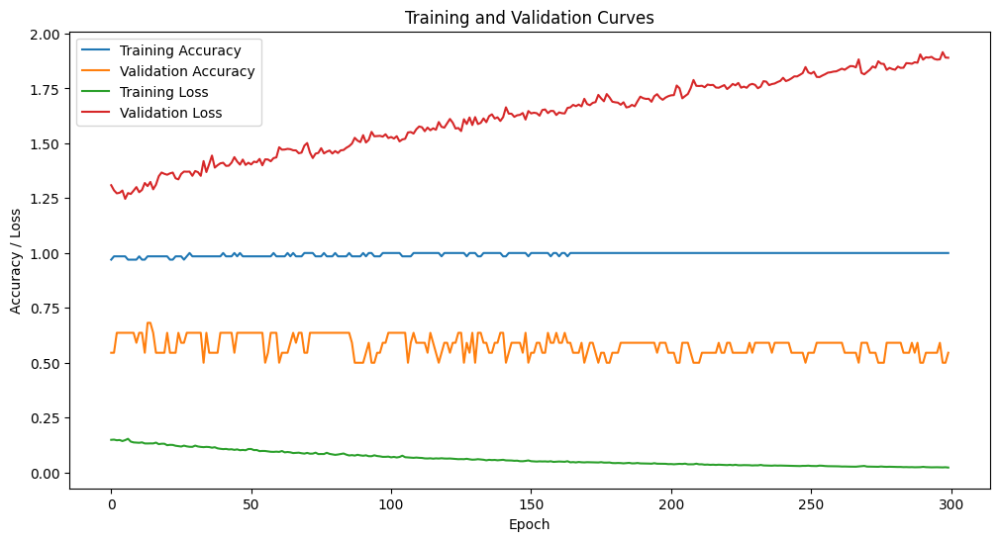

In [76]:
## Your code to plot training and validation curves in a single plot (Make changes in the model cell to be able to do this)
history = keras_model.fit(preprocessor(X_train), y_train, batch_size=20, epochs=300, validation_split=0.25)

# Plot training and validation curves
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Accuracy / Loss')
plt.title('Training and Validation Curves')
plt.legend()
plt.show()

In [77]:
# Save keras model to ONNX file

from aimodelshare.aimsonnx import model_to_onnx

onnx_model = model_to_onnx(keras_model, framework='keras',
                          transfer_learning=False,
                          deep_learning=True)

with open("model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [78]:
# Submit keras model:

#-- Generate predicted y values

#Note: Keras predict returns the predicted column index location for classification models
y_pred = keras_model.predict(preprocessor(X_test))
prediction_column_index = np.argmax(y_pred, axis=1) # Predict

# extract correct prediction labels
prediction_labels = [y_train.columns[i] for i in prediction_column_index]

model_filepath5 = "model.onnx"

# Submit Model 1 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath5,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)

3/3 [==============================] - 0s 4ms/step
Insert search tags to help users find your model (optional): QMSS
Provide any useful notes about your model (optional): Qiankun Li

Your model has been submitted as model version 1134

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [79]:
# Check leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

In [80]:
## You are encouraged to try more experimentation and any other models by adding more code cells to this notebook:
feature_count=X_train_processed.shape[1]#count features in input data
from keras.regularizers import l2

keras_model2 = Sequential()
keras_model2.add(Dense(256, input_dim=feature_count, activation='relu', kernel_regularizer=l2(0.001)))
keras_model2.add(Dense(128, input_dim=feature_count, activation='relu'))
keras_model2.add(Dense(64, activation='relu'))
keras_model2.add(Dense(64, activation='relu'))
keras_model2.add(Dense(32, activation='relu'))## Define a Neural Network Model with 5 layers 128->64->64->32->(?)


#Use Softmax activation in last layer. How many neurons should there be in the last layer?
num_classes = 5
keras_model2.add(Dense(num_classes, activation='softmax'))


# Compile model
keras_model2.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Fitting the NN to the Training set
keras_model2.fit(preprocessor(X_train), y_train, ## Note that keras models require a one-hot-encoded y_train object
               batch_size = 10,
               epochs = 300, validation_split=0.25)

y_pred2 = keras_model2.predict(preprocessor(X_test))
prediction_column_index2 = np.argmax(y_pred2, axis=1) # Predict

# extract correct prediction labels
prediction_labels2 = [y_train.columns[i] for i in prediction_column_index2]

model_filepath5 = "model.onnx"

mycompetition.submit_model(model = model_filepath5,
                                 prediction_submission=prediction_labels2,
                                 preprocessor=preprocessor_filepath)
## You can also try to import any new dataset pertaining to countries, merge it, and see if it helps the predictions.
## If it does not, try to explain why it wasn't helpful by exploring variable relationships.

Epoch 1/300
7/7 [==============================] - 1s 48ms/step - loss: 1.6831 - accuracy: 0.2121 - val_loss: 1.6798 - val_accuracy: 0.0909
Epoch 2/300
7/7 [==============================] - 0s 8ms/step - loss: 1.6696 - accuracy: 0.2273 - val_loss: 1.6756 - val_accuracy: 0.0909
Epoch 3/300
7/7 [==============================] - 0s 9ms/step - loss: 1.6584 - accuracy: 0.2879 - val_loss: 1.6718 - val_accuracy: 0.1364
Epoch 4/300
7/7 [==============================] - 0s 9ms/step - loss: 1.6488 - accuracy: 0.3030 - val_loss: 1.6692 - val_accuracy: 0.1818
Epoch 5/300
7/7 [==============================] - 0s 11ms/step - loss: 1.6405 - accuracy: 0.3788 - val_loss: 1.6667 - val_accuracy: 0.1818
Epoch 6/300
7/7 [==============================] - 0s 10ms/step - loss: 1.6334 - accuracy: 0.3636 - val_loss: 1.6647 - val_accuracy: 0.1818
Epoch 7/300
7/7 [==============================] - 0s 11ms/step - loss: 1.6267 - accuracy: 0.4091 - val_loss: 1.6629 - val_accuracy: 0.1818
Epoch 8/300
7/7 [======

# 7. Submission of final report and clean code to github

[This is a final project you display on your GitHub to the World]

**Instructions**
- Make a new notebook, visualize any plots you found relevant
- Reproduce the code you used for the best models and display results
- Write what insights you found useful and what behaviours were observed
- Make it in a style of a clean, succint report (within the .ipynb)
- Upload this final report notebook to a new repository in your personal github account
- Remember to paste the link of your final repo at the top of this notebook where asked

Github Repo: